In [1]:
import sunpy
import sunpy.map
import matplotlib.colors as colors
from astropy import *
import astropy.units as u
import pathlib
import json, urllib, numpy as np, matplotlib.pylab as plt, matplotlib.ticker as mtick, requests
import sunpy.map
import drms
from astropy.io import fits
from astropy.coordinates import SkyCoord
import astropy.units as u
from sunpy.cm import color_tables as ct
import sunpy.coordinates
from datetime import datetime as dt_obj
import matplotlib.dates as mdates
import matplotlib.colors as mcol
import matplotlib.patches as ptc
from matplotlib.dates import *
import math

import drms
c = drms.Client()

import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits

In [3]:
aia_dir = 'AIA0304'
hmi_dir = 'HMI'

In [4]:
aia_files = sorted(os.listdir(aia_dir))
hmi_files = sorted(os.listdir(hmi_dir))

In [5]:
print(len(aia_files))
print(len(hmi_files))

730
730


In [6]:
aia_files[0]

'aia_lev1_304a_2012_01_01t00_00_08_14z_image_lev1.fits'

In [7]:
hmi_files[0]

'hmi_m_45s_2012_01_01_00_01_30_tai_magnetogram.fits'

# AIA

In [8]:
# aia_5 = aia_files[:5]
# hmi_5 = hmi_files[:5]
'''
AIA
0:100     removed bad quality: 80, 86 DONE

'''

'\nAIA\n0:100     removed bad quality: 80, 86 DONE\n\n'

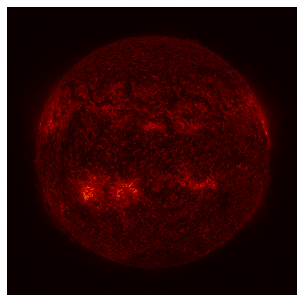

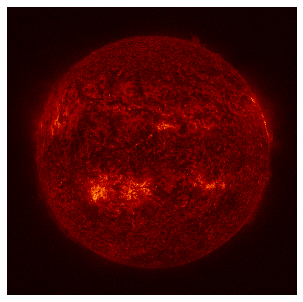

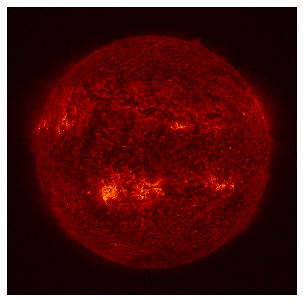

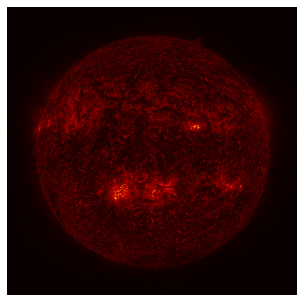

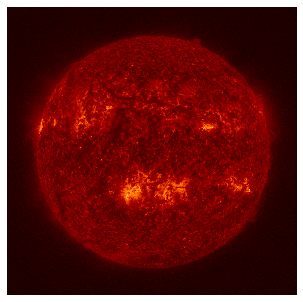

...

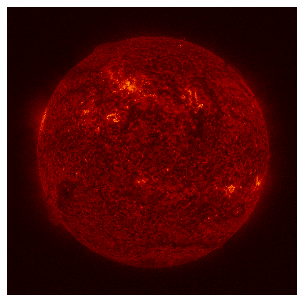

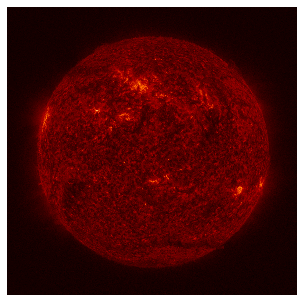

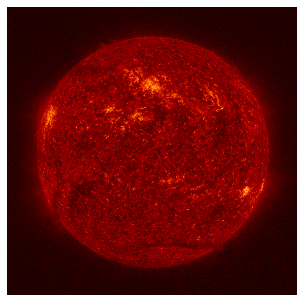

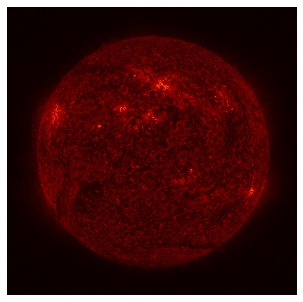

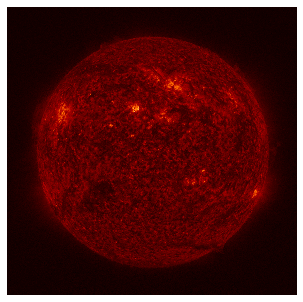

In [21]:
num = 0
for file in aia_files[0:100]:
    aia_map = sunpy.map.Map(os.path.join(aia_dir, file))
    figure = plt.figure(frameon=False)
    axes = plt.Axes(figure, [0., 0., 1., 1.])
    axes.set_axis_off()
    figure.add_axes(axes)
    im = aia_map.plot(axes=axes, annotate=False)
    im.write_png(f'IMAGES/AIA304/aia_304_{num}.png')
    num = num + 1

In [11]:
# import os
# import tarfile
# def tardir(path, tar_name):
#     with tarfile.open(tar_name, "w:gz") as tar_handle:
#         for root, dirs, files in os.walk(path):
#             for file in files:
#                 tar_handle.add(os.path.join(root, file))
# tardir('IMAGES/AIA304', 'AIA0_100.tar.gz')

# HMI

In [12]:
import matplotlib.pyplot as plt
from reproject import reproject_interp

import astropy.units as u

import sunpy.map
from sunpy.net import Fido
from sunpy.net import attrs as a

In [ ]:
hmi_map = sunpy.map.Map(os.path.join(hmi_dir, file))
aia_map = sunpy.map.Map(os.path.join(aia_dir, file))

output, footprint = reproject_interp(hmi_map, aia_map.wcs, aia_map.data.shape)

out_hmi = sunpy.map.Map(output, aia_map.wcs)

figure = plt.figure(frameon=False)
axes = plt.Axes(figure, [0., 0., 1., 1.])

axes.set_axis_off()
figure.add_axes(axes)

img = out_hmi.plot(axes=axes, annotate=False)

img.write_png('hmi_01.png')